The goal is to understand how the road network intersections,road types,traffic control measures influences accident severity and to rank location based on their risk level

In [ ]:
# pip install geopandas networkx folium matplotlib seaborn openpyxl

In [ ]:
import pandas as pd
import geopandas as gpd
import networkx as nx
import folium
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

In [ ]:
#filepath='Police-Traffic.csv'

In [ ]:
df = pd.read_csv('/content/combined_data.csv')

In [ ]:
df.head()

,District,PS Name,FIR No,Date Report,Date Accident,Time Report,Time Accident,Sections,Accident type,Death,Grievous,Minor,Pedestrian,Cyclist,Latitude,Longitude,Place of Occurance,Type Area,City/Town/ Village,Lanes Road,Divider,Spot Accident,Weather,T -Junction,Collision,Type Road,Road Features,Visibility,Traffic Control,Accussed Vehicle,Victim Vehicle
0,THIRUVANANTHAPURAM CITY,Vattiyoorkavu,7000/2019,2019-01-13,2019-12-01,18:00:00,17:30:00,"279,337,338",Minor Injury,0,0,2,0,0,10.190200,76.200200,MOOTHAKUNNAM,Rural,Village,Single,no,Near bus stop,Sunny/Clear,T- Junction,Hit from Back,National Highway,Straight Road,Good,Uncontrolled,Tipper,Motor Cycle
1,THIRUVANANTHAPURAM CITY,Vanchiyoor,7001/2019,2019-01-04,2019-12-31,11:25:00,06:30:00,279,Fatal,1,0,0,1,0,10.107051,76.261841,KAVILNADA,Rural,Village,Double,no,At pedestrian crossing,Sunny/Clear,Staggered junction,Hit Pedestrian,National Highway,Straight Road,Good,Uncontrolled,Motor Cycle,Motor Cycle
2,THIRUVANANTHAPURAM CITY,Vanchiyoor,7002/2019,2019-01-02,2019-12-24,17:40:00,08:45:00,MO(Minor),Grevious Injury,0,1,0,0,0,9.942077,76.644036,VAZHAKULAM,Rural,Town,Double,no,Market/Commercial area,Sunny/Clear,NaN,Hit from Back,State Highway,Straight Road,Good,Uncontrolled,Motor Cycle,Scooter
3,THIRUVANANTHAPURAM CITY,Vanchiyoor,7003/2019,2019-01-02,2019-01-01,16:13:00,14:15:00,"279,337,338",Grevious Injury,0,1,0,0,0,9.996156,76.593602,PERUMATTAM,Rural,Village,Double,no,Market/Commercial area,Sunny/Clear,T- Junction,Hit from Back,Other Road,Curved Road,Good,Uncontrolled,Auto rickshaw,Motor Cycle
4,THIRUVANANTHAPURAM CITY,Vanchiyoor,7004/2019,2019-01-08,2019-01-17,18:15:00,17:45:00,"279,337,338",Grevious Injury,0,1,1,0,0,9.941782,76.644568,NEAR FEDERAL BANK VAZHAKULAM,Rural,Village,Double,no,Near office complex,Sunny/Clear,NaN,Hit from Side,State Highway,Straight Road,Good,Uncontrolled,Motor Cycle,Car


In [ ]:
Distric_ps_map = {}
for District in  df['District'].unique():
    Distric_ps_map[District] = list(df[df['District'] == District]['PS Name'].unique())


In [ ]:
Distric_ps_map

{'THIRUVANANTHAPURAM CITY': ['Vattiyoorkavu',
  'Vanchiyoor',
  'Thumba',
  'Kazhakkuttom',
  'Thiruvallam',
  'Nemom',
  'Medical College',
  'Poonthura',
  'Peroorkada',
  'Sreekariyam',
  'Fort',
  'Valiyathura',
  'Poojappura',
  'Museum',
  'Vizhinjam',
  'Thampanoor',
  'Cantonment',
  'Pettah',
  'Kovalam',
  'Mannanthala',
  'Karamana'],
 'THIRUVANANTHAPURAM RURAL': ['Kadinamkulam',
  'Varkala',
  'Balaramapuram',
  'Aruvikkara',
  'Chirayinkil',
  'Kattakkada',
  'Attingal',
  'Neyyattinkara',
  'Palode',
  'Vellarada',
  'Pothencode',
  'Vattappara',
  'Maranalloor',
  'Ayiroor ',
  'Pozhiyoor',
  'Kallambalam',
  'Poovar',
  'Kilimanoor',
  'Malayinkil',
  'Mangalapuram',
  'Pangode',
  'Nedumangad',
  'Parassala',
  'Naruvamoodu',
  'Kanjiramkulam',
  'Marayamuttom',
  'Ariyancode',
  'Valiyamala',
  'Anchuthengu ',
  'Venjarammood',
  'Pallickal',
  'Kadakkavoor',
  'Aryanad',
  'Neyyardam',
  'Nagarur',
  'Vilappilsala',
  'Vithura',
  'Ponmudi'],
 'KOLLAM CITY': ['Karuna

In [ ]:
df['Weather'].unique()

array(['Sunny/Clear', 'Mist/Fog', 'Very Hot', 'Cloudy', 'Snow',
       'Light rain', 'Heavy rain', 'Dust Storm', 'Hail/Sleet',
       'Very Cold'], dtype=object)

In [ ]:
df['Type Area'].unique()

array(['Rural', 'Urban'], dtype=object)

In [ ]:
df['Collision'].unique()

array(['Hit from Back', 'Hit Pedestrian', 'Hit from Side', 'Hit and run',
       'Right-angled collision', 'Other', 'Head on Collision',
       'Right turn collision', 'Rear end collision', 'Overturn',
       'Run off the Road', 'With parked vehicle', 'Skidding',
       'Collision brush/side swipe', 'Hit Fix / Stationary Object',
       'With animal'], dtype=object)

In [ ]:
df['Type Road'].unique()

array(['National Highway', 'State Highway', 'Other Road', 'ODR', 'Bypass',
       'MDR'], dtype=object)

In [ ]:
df['Road Features'].unique()

array(['Straight Road', 'Curved Road', 'Others',
       'Ongoing Road Works/Under Construction', 'Bridge', 'Steep Grade',
       'Culvert', 'Pot Holes'], dtype=object)

In [ ]:
df['Traffic Control'].unique()

array(['Uncontrolled', 'Police controlled', 'Flashing signal/blinker',
       'Traffic light signal', 'Stop sign'], dtype=object)

In [ ]:
df.isna().sum()

,0
District,0
PS Name,0
FIR No,0
Date Report,0
Date Accident,0
Time Report,0
Time Accident,0
Sections,0
Accident type,0
Death,0


In [ ]:
#show all columns
pd.set_option('display.max_columns', None)

In [ ]:
df.head()

,District,PS Name,FIR No,Date Report,Date Accident,Time Report,Time Accident,Sections,Accident type,Death,Grievous,Minor,Pedestrian,Cyclist,Latitude,Longitude,Place of Occurance,Type Area,City/Town/ Village,Lanes Road,Divider,Spot Accident,Weather,T -Junction,Collision,Type Road,Road Features,Visibility,Traffic Control,Accussed Vehicle,Victim Vehicle
0,THIRUVANANTHAPURAM CITY,Vattiyoorkavu,7000/2019,2019-01-13,2019-12-01,18:00:00,17:30:00,"279,337,338",Minor Injury,0,0,2,0,0,10.190200,76.200200,MOOTHAKUNNAM,Rural,Village,Single,no,Near bus stop,Sunny/Clear,T- Junction,Hit from Back,National Highway,Straight Road,Good,Uncontrolled,Tipper,Motor Cycle
1,THIRUVANANTHAPURAM CITY,Vanchiyoor,7001/2019,2019-01-04,2019-12-31,11:25:00,06:30:00,279,Fatal,1,0,0,1,0,10.107051,76.261841,KAVILNADA,Rural,Village,Double,no,At pedestrian crossing,Sunny/Clear,Staggered junction,Hit Pedestrian,National Highway,Straight Road,Good,Uncontrolled,Motor Cycle,Motor Cycle
2,THIRUVANANTHAPURAM CITY,Vanchiyoor,7002/2019,2019-01-02,2019-12-24,17:40:00,08:45:00,MO(Minor),Grevious Injury,0,1,0,0,0,9.942077,76.644036,VAZHAKULAM,Rural,Town,Double,no,Market/Commercial area,Sunny/Clear,NaN,Hit from Back,State Highway,Straight Road,Good,Uncontrolled,Motor Cycle,Scooter
3,THIRUVANANTHAPURAM CITY,Vanchiyoor,7003/2019,2019-01-02,2019-01-01,16:13:00,14:15:00,"279,337,338",Grevious Injury,0,1,0,0,0,9.996156,76.593602,PERUMATTAM,Rural,Village,Double,no,Market/Commercial area,Sunny/Clear,T- Junction,Hit from Back,Other Road,Curved Road,Good,Uncontrolled,Auto rickshaw,Motor Cycle
4,THIRUVANANTHAPURAM CITY,Vanchiyoor,7004/2019,2019-01-08,2019-01-17,18:15:00,17:45:00,"279,337,338",Grevious Injury,0,1,1,0,0,9.941782,76.644568,NEAR FEDERAL BANK VAZHAKULAM,Rural,Village,Double,no,Near office complex,Sunny/Clear,NaN,Hit from Side,State Highway,Straight Road,Good,Uncontrolled,Motor Cycle,Car


In [ ]:
# conerting time accident in hours
df['Time Accident'] = pd.to_datetime(df['Time Accident'], format='%H:%M:%S')
df['Time Accident'] = df['Time Accident'].dt.hour
df['Time Accident'].unique()

array([17,  6,  8, 14, 13, 21, 12, 16, 20, 15, 19, 22,  3,  9,  5, 18, 10,
       11,  7, 23,  1,  2,  0,  4], dtype=int32)

In [ ]:
# group time accident
df['Time Accident'] = pd.cut(df['Time Accident'], bins=[0, 6, 12, 18, 24], labels=['Night', 'Morning', 'Afternoon', 'Evening'])
df['Time Accident'].unique()

['Afternoon', 'Night', 'Morning', 'Evening', NaN]
Categories (4, object): ['Night' < 'Morning' < 'Afternoon' < 'Evening']

In [ ]:
# remove NaN value from Time accident
df = df.dropna(subset=['Time Accident'])

In [ ]:
df['Time Accident'].unique()

['Afternoon', 'Night', 'Morning', 'Evening']
Categories (4, object): ['Night' < 'Morning' < 'Afternoon' < 'Evening']

In [ ]:
df['FIR No'] = pd.to_datetime(df['FIR No'], errors='coerce')
df['Date Report'] = pd.to_datetime(df['Date Report'], errors='coerce')
df['Accident type'].fillna('Unknown', inplace=True)

<ipython-input-298-dd8591b02c4f>:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['FIR No'] = pd.to_datetime(df['FIR No'], errors='coerce')
<ipython-input-298-dd8591b02c4f>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Accident type'].fillna('Unknown', inplace=True)


In [ ]:
df['Severity Score'] = df['Accident type'].apply(lambda x: 3 if x == 'Fatal' else (2 if x == 'Grevious Injury' else 1))


In [ ]:
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['Longitude'], df['Latitude']), crs="EPSG:4326")


In [ ]:
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=10)


In [ ]:
for idx, row in df.iterrows():
    severity_color = 'red' if row['Severity Score'] == 3 else ('orange' if row['Severity Score'] == 2 else 'green')
    folium.CircleMarker(location=(row['Latitude'], row['Longitude']),
                        radius=5, color=severity_color, fill=True).add_to(m)

m


In [ ]:
G = nx.Graph()


In [ ]:
for idx, row in df.iterrows():
    G.add_edge(row['PS Name'], row['District'], weight=row['Severity Score'])


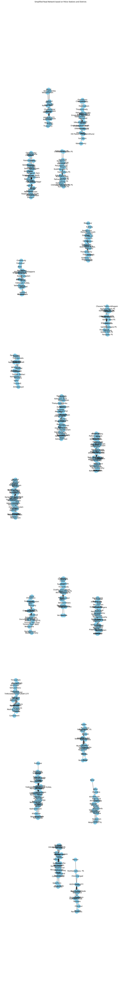

In [ ]:
plt.figure(figsize=(12, 100))
nx.draw(G, with_labels=True, node_size=700, node_color="skyblue", font_size=12, font_color="black")
plt.title("Simplified Road Network based on Police Stations and Districts")
plt.show()

In [ ]:
centrality = nx.betweenness_centrality(G, weight='weight')
centrality_df = pd.DataFrame(centrality.items(), columns=['Location', 'Betweenness Centrality'])



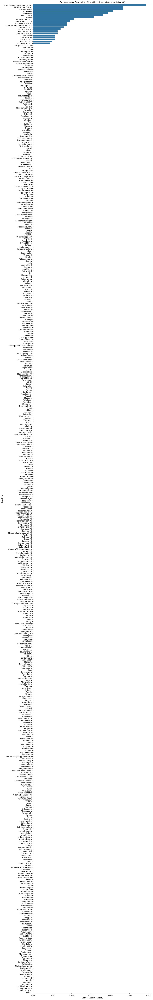

In [ ]:
plt.figure(figsize=(12, 100))
sns.barplot(x='Betweenness Centrality', y='Location', data=centrality_df.sort_values('Betweenness Centrality', ascending=False))
plt.title('Betweenness Centrality of Locations (Importance in Network)')
plt.show()


In [ ]:
severity_ranking = df.groupby('PS Name')['Severity Score'].sum().reset_index()
severity_ranking = severity_ranking.sort_values(by='Severity Score', ascending=False)



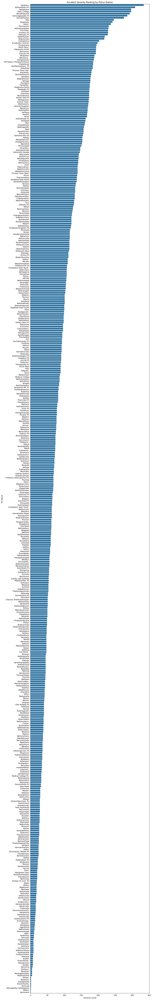

In [ ]:
plt.figure(figsize=(12, 100))
sns.barplot(x='Severity Score', y='PS Name', data=severity_ranking)
plt.title('Accident Severity Ranking by Police Station')
plt.show()

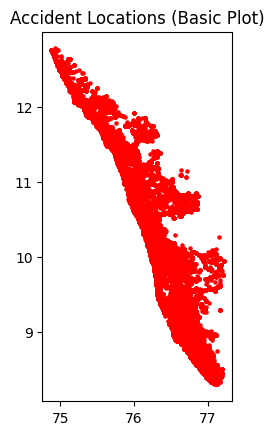

In [ ]:
gdf.plot(marker='o', color='red', markersize=5)
plt.title("Accident Locations (Basic Plot)")
plt.show()


In [ ]:
from scipy.interpolate import griddata
import numpy as np


In [ ]:
grid_x, grid_y = np.mgrid[min(df['Longitude']):max(df['Longitude']):100j,
                          min(df['Latitude']):max(df['Latitude']):100j]


In [ ]:
points = df[['Longitude', 'Latitude']].values
values = df['Severity Score'].values
grid_z = griddata(points, values, (grid_x, grid_y), method='linear')

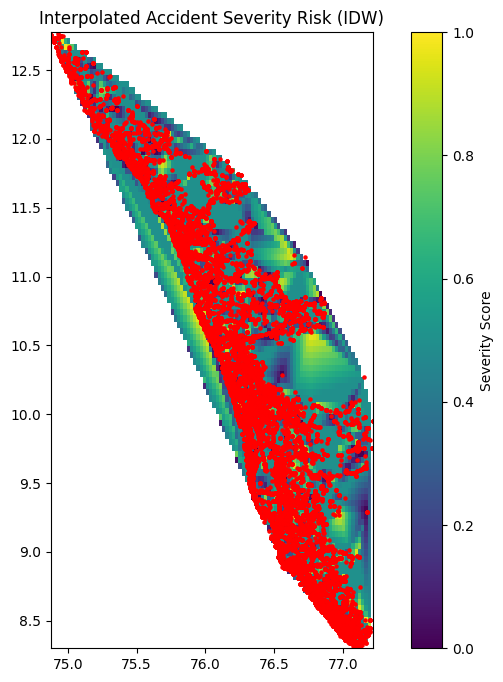

In [ ]:
plt.figure(figsize=(10,8))
plt.imshow(grid_z.T, extent=(min(df['Longitude']), max(df['Longitude']),
                            min(df['Latitude']), max(df['Latitude'])), origin='lower')
plt.scatter(df['Longitude'], df['Latitude'], c='r', s=5)
plt.title("Interpolated Accident Severity Risk (IDW)")
plt.colorbar(label='Severity Score')
plt.show()

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
df.head()

,District,PS Name,FIR No,Date Report,Date Accident,Time Report,Time Accident,Sections,Accident type,Death,Grievous,Minor,Pedestrian,Cyclist,Latitude,Longitude,Place of Occurance,Type Area,City/Town/ Village,Lanes Road,Divider,Spot Accident,Weather,T -Junction,Collision,Type Road,Road Features,Visibility,Traffic Control,Accussed Vehicle,Victim Vehicle,Severity Score
0,THIRUVANANTHAPURAM CITY,Vattiyoorkavu,NaT,2019-01-13,2019-12-01,18:00:00,Afternoon,"279,337,338",Minor Injury,0,0,2,0,0,10.190200,76.200200,MOOTHAKUNNAM,Rural,Village,Single,no,Near bus stop,Sunny/Clear,T- Junction,Hit from Back,National Highway,Straight Road,Good,Uncontrolled,Tipper,Motor Cycle,1
1,THIRUVANANTHAPURAM CITY,Vanchiyoor,NaT,2019-01-04,2019-12-31,11:25:00,Night,279,Fatal,1,0,0,1,0,10.107051,76.261841,KAVILNADA,Rural,Village,Double,no,At pedestrian crossing,Sunny/Clear,Staggered junction,Hit Pedestrian,National Highway,Straight Road,Good,Uncontrolled,Motor Cycle,Motor Cycle,3
2,THIRUVANANTHAPURAM CITY,Vanchiyoor,NaT,2019-01-02,2019-12-24,17:40:00,Morning,MO(Minor),Grevious Injury,0,1,0,0,0,9.942077,76.644036,VAZHAKULAM,Rural,Town,Double,no,Market/Commercial area,Sunny/Clear,NaN,Hit from Back,State Highway,Straight Road,Good,Uncontrolled,Motor Cycle,Scooter,2
3,THIRUVANANTHAPURAM CITY,Vanchiyoor,NaT,2019-01-02,2019-01-01,16:13:00,Afternoon,"279,337,338",Grevious Injury,0,1,0,0,0,9.996156,76.593602,PERUMATTAM,Rural,Village,Double,no,Market/Commercial area,Sunny/Clear,T- Junction,Hit from Back,Other Road,Curved Road,Good,Uncontrolled,Auto rickshaw,Motor Cycle,2
4,THIRUVANANTHAPURAM CITY,Vanchiyoor,NaT,2019-01-08,2019-01-17,18:15:00,Afternoon,"279,337,338",Grevious Injury,0,1,1,0,0,9.941782,76.644568,NEAR FEDERAL BANK VAZHAKULAM,Rural,Village,Double,no,Near office complex,Sunny/Clear,NaN,Hit from Side,State Highway,Straight Road,Good,Uncontrolled,Motor Cycle,Car,2


In [ ]:
label_encoders = {}
for column in ['Type Road', 'Road Features', 'Traffic Control','Type Area','Weather','Time Accident','Collision','District','PS Name']:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].astype(str))
    label_encoders[column] = le

In [ ]:
#label encoder pickle file
import pickle
with open('label_encoders.pkl', 'wb') as f:
    pickle.dump(label_encoders, f)

In [ ]:
df.head()

,District,PS Name,FIR No,Date Report,Date Accident,Time Report,Time Accident,Sections,Accident type,Death,Grievous,Minor,Pedestrian,Cyclist,Latitude,Longitude,Place of Occurance,Type Area,City/Town/ Village,Lanes Road,Divider,Spot Accident,Weather,T -Junction,Collision,Type Road,Road Features,Visibility,Traffic Control,Accussed Vehicle,Victim Vehicle,Severity Score
0,15,446,NaT,2019-01-13,2019-12-01,18:00:00,0,"279,337,338",Minor Injury,0,0,2,0,0,10.190200,76.200200,MOOTHAKUNNAM,0,Village,Single,no,Near bus stop,7,T- Junction,5,2,7,Good,4,Tipper,Motor Cycle,1
1,15,438,NaT,2019-01-04,2019-12-31,11:25:00,3,279,Fatal,1,0,0,1,0,10.107051,76.261841,KAVILNADA,0,Village,Double,no,At pedestrian crossing,7,Staggered junction,3,2,7,Good,4,Motor Cycle,Motor Cycle,3
2,15,438,NaT,2019-01-02,2019-12-24,17:40:00,2,MO(Minor),Grevious Injury,0,1,0,0,0,9.942077,76.644036,VAZHAKULAM,0,Town,Double,no,Market/Commercial area,7,NaN,5,5,7,Good,4,Motor Cycle,Scooter,2
3,15,438,NaT,2019-01-02,2019-01-01,16:13:00,0,"279,337,338",Grevious Injury,0,1,0,0,0,9.996156,76.593602,PERUMATTAM,0,Village,Double,no,Market/Commercial area,7,T- Junction,5,4,2,Good,4,Auto rickshaw,Motor Cycle,2
4,15,438,NaT,2019-01-08,2019-01-17,18:15:00,0,"279,337,338",Grevious Injury,0,1,1,0,0,9.941782,76.644568,NEAR FEDERAL BANK VAZHAKULAM,0,Village,Double,no,Near office complex,7,NaN,6,5,7,Good,4,Motor Cycle,Car,2


In [ ]:
X = df[['Type Road', 'Road Features', 'Traffic Control','Type Area','Weather','Time Accident','Collision','District','PS Name']]
y = df['Severity Score']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
X_train.columns

Index(['Type Road', 'Road Features', 'Traffic Control', 'Type Area', 'Weather',
       'Time Accident', 'Collision', 'District', 'PS Name'],
      dtype='object')

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
y_pred = rf_model.predict(X_test)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Confusion Matrix:
 [[ 125  846   29]
 [ 233 4073  112]
 [  34  443   61]]

Classification Report:
               precision    recall  f1-score   support

           1       0.32      0.12      0.18      1000
           2       0.76      0.92      0.83      4418
           3       0.30      0.11      0.16       538

    accuracy                           0.72      5956
   macro avg       0.46      0.39      0.39      5956
weighted avg       0.64      0.72      0.66      5956



In [ ]:
feature_importances = pd.DataFrame(rf_model.feature_importances_,
                                   index=X.columns,
                                   columns=['Importance']).sort_values('Importance', ascending=False)
print("\nFeature Importances:\n", feature_importances)


Feature Importances:
                  Importance
PS Name            0.359658
District           0.173804
Collision          0.161487
Time Accident      0.068194
Road Features      0.065126
Type Road          0.051974
Traffic Control    0.048747
Type Area          0.037025
Weather            0.033985


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder



manual_input_data = pd.DataFrame({
    'Type Road': ['National Highway'],
    'Road Features': ['Straight Road'],
    'Traffic Control': ['Uncontrolled'],
    'Type Area':['Rural'],
    'Weather':['Sunny/Clear'],
    'Time Accident':['Afternoon	'] ,
    'Collision':['Hit from Back'],
    'District':['THIRUVANANTHAPURAM CITY'],
    'PS Name':['Vattiyoorkavu']
})

for column in ['Type Road', 'Road Features', 'Traffic Control','Type Area','Weather','Time Accident','Collision','District','PS Name']:
    le = label_encoders[column]


    if manual_input_data[column].astype(str).iloc[0] not in le.classes_:
        le.classes_ = np.append(le.classes_, manual_input_data[column].astype(str).iloc[0])

    manual_input_data[column] = le.transform(manual_input_data[column].astype(str))

In [ ]:
manual_input_pred = rf_model.predict(manual_input_data)

In [ ]:
# conveting into actual values
if manual_input_pred[0] == 3:
    print("\nPredicted Severity Score for Manual Input Data: Fatal")
elif manual_input_pred[0] ==  2:
    print("\nPredicted Severity Score for Manual Input Data: Grevious Injury")
elif manual_input_pred[0] == 1:
    print("\nPredicted Severity Score for Manual Input Data: Minor Injury")


Predicted Severity Score for Manual Input Data: Grevious Injury


In [ ]:
import pickle
filename = 'finalized_model.pkl'
pickle.dump(rf_model, open(filename, 'wb'))